<a href="https://colab.research.google.com/github/YoungHyunKoo/GEE_remote_sensing/blob/main/Week3/3_2_Time_Series.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### **[GEO 6083] Remote Sensing Imge Processing - Spring 2024**
# **WEEK 3-2. Time Series**

### OBJECTIVES
1. Generate timelapse animation
2. Create time series charts
3. Create image histogram

Credited by Younghyun Koo (kooala317@gmail.com)

## How to extract time series change using a series of images in Earth Engine?
By using multiples images provided via Google Earth Engine, you can create timelapse animations or you can see the temporal variations of values by time. In this turorial, you will create a timelapse animation to see the growth of urban area in Las Vegas. In addition, you will create a chart to see the temporal variations of NDVI value for a certain point of your interest. Finally, you will create a histogram of NDVI value for a specific area for more detailed statistical analysis.

# **1. Create Landsat Timelapse**

In [1]:
# Import ee library
import ee

# Authenticate
ee.Authenticate()

# Initialize with your own project.
ee.Initialize(project = "utsa-spring2024")

In [2]:
# Import geemap library
import geemap

# Import os libray
import os

In [3]:
# Install an additional phthon package for this tutorial
!pip install ffmpeg-python

In [4]:
# Import the package we just installed
import ffmpeg

We will create a timelapse animation to see the urban growth in Las Vegas area. We will use the fuction named `add_landsat_ts_gif` of `geemap` library. First, we will define the area of interest we want to visualize.
[How to define a polygon](https://developers.google.com/earth-engine/apidocs/ee-geometry-polygon)

In [5]:
# Las Vegas area
roi = ee.Geometry.Polygon(
    [
        [
            [-115.471773, 35.892718],
            [-115.471773, 36.409454],
            [-114.271283, 36.409454],
            [-114.271283, 35.892718],
            [-115.471773, 35.892718],
        ]
    ]
)

In [6]:
# Import image collection - Landsat 8 surface reflectance
Map = geemap.Map()
Map

label = 'Urban Growth in Las Vegas'
Map.add_landsat_ts_gif(
    label=label,
    start_year = 1984,
    end_year = 2024,
    bands=['NIR', 'Red', 'Green'],
    font_color='white',
    frames_per_second=2,
    progress_bar_color='blue',
    roi = roi
)

Map.centerObject(roi, 10)
Map

Generating URL...
Please wait ...
The GIF image has been saved to: /tmp/416f70c1-b324-4cda-a721-f9c9f137abe5.gif
Adding GIF to the map ...
The timelapse has been added to the map.


Map(center=[36.152299930738394, -114.87152800000007], controls=(WidgetControl(options=['position', 'transparen…

***DO IT YOURSELF!!***
- Visualize the timelapse images of false color images, instead of the true color image we just created. For example, please try the band combination of [NIR, Red, Blue].
- Please change several input parameters of the `add_landsat_ts_gif` function. (e.g. font color, frames per seconds, etc.)

Similarly, let's create timelapse for San Antonio area.

In [7]:
# San Antonio area
roi = ee.Geometry.Polygon(
    [
        [
            [-98.8, 29.2],
            [-98.8, 29.6],
            [-98.2, 29.6],
            [-98.2, 29.2],
            [-98.8, 29.2],
        ]
    ],

)

In [8]:
# Import image collection - Landsat 8 surface reflectance
Map = geemap.Map()
Map

label = 'Urban Growth in San Antonio'
Map.add_landsat_ts_gif(
    label=label,
    start_year = 1990,
    end_year = 2024,
    bands=['Red', 'Green', 'Blue'],
    font_color='white',
    frames_per_second=2,
    progress_bar_color='blue',
    roi = roi
)

Map.centerObject(roi, 10)
Map

Generating URL...
Please wait ...
The GIF image has been saved to: /tmp/2bd6d448-7c00-4ede-b012-6135d96168c5.gif
Adding GIF to the map ...
The timelapse has been added to the map.


Map(center=[29.40020476940133, -98.50000000000033], controls=(WidgetControl(options=['position', 'transparent_…

So far, we just visualized the timelapse image on the `geemap` Map. We can also save this animation as an independent gif file.

In [9]:
# Las Vegas Area
roi = ee.Geometry.Polygon(
    [
        [
            [-115.471773, 35.892718],
            [-115.471773, 36.409454],
            [-114.271283, 36.409454],
            [-114.271283, 35.892718],
            [-115.471773, 35.892718],
        ]
    ],

)

In [11]:
# Import image collection for this roi
collection = geemap.landsat_timeseries(
    roi=roi, start_year=1985, end_year=2024 #, start_date='06-10', end_date='09-20'
)

# Print out how many images are there for this image collection
print(collection.size().getInfo())

40


In [12]:
# Name of the gif file
out_gif = "landsat_ts.gif"

# Define arguments for animation function parameters.
video_args = {
    'region': roi,
    'framesPerSecond': 3,
    'bands': ['NIR', 'Red', 'Green'],
    'min': 0,
    'max': 0.4,
    'gamma': [1, 1, 1],
}

geemap.download_ee_video(collection, video_args, out_gif)

geemap.show_image(out_gif)

Generating URL...
Please wait ...
The GIF image has been saved to: /content/landsat_ts.gif


Output()

We can add any text to this gif file.

In [13]:
# Name of the texted gif file
texted_gif = "landsat_ts_text.gif"

# add text to the gif file
geemap.add_text_to_gif(
    out_gif,
    texted_gif,
    xy=('3%', '5%'), # xy location
    text_sequence=1985,
    font_size=30,
    font_color='#ffffff',
    add_progress_bar=False,
)

label = 'Urban Growth in Las Vegas'
geemap.add_text_to_gif(
    texted_gif,
    texted_gif,
    xy=('2%', '88%'), # xy location
    text_sequence=label,
    font_size=30,
    font_color='#ffffff',
    progress_bar_color='cyan',
)

geemap.show_image(texted_gif)

Output()

# **2. Create Sentinel-1 SAR Timelapse**

In addition to Landsat, you can make a timelapse of Sentinel-1 synthetic aperture radar (SAR) images using `sentinel1_timelapse` function. Let's make a timelapse to see the calving of icebergs in the Antarctica. While we visualize the Landsat image in yearly time periods because the cloud-free images are rare, we can make daily timelapse with SAR images because SAR sensor is not affected by cloud conditions.

In [14]:
# Region of interest: Amundsen Sea, Antarctica
roi = ee.Geometry.BBox(-107.5, -75.0, -106.5, -74.8)

# Visualize a example image (first image in January 1st)
image = ee.ImageCollection("COPERNICUS/S1_GRD").filterDate("2019-01-01", "2019-01-31").filterBounds(roi).first().select(["HH"])

# Visualize the image on the map
Map = geemap.Map()
Map.addLayer(image, {'min': -30, 'max': 0}, "S1")
Map.addLayer(roi, {}, "roi")

Map.centerObject(roi, 8)
Map

Map(center=[-74.89996729042227, -106.9999999999998], controls=(WidgetControl(options=['position', 'transparent…

In [15]:
# Create time series GIF file (daily timelapse)

timelapse = geemap.sentinel1_timelapse(
    roi,
    out_gif="sentinel1.gif",
    start_year=2019,
    end_year=2019,
    start_date="01-01",
    end_date="01-31",
    frequency="day",
    bands = ['HH'],
    vis_params={"min": -30, "max": 0},
    palette=["black", "white"],
    frames_per_second=1,
    title="Sentinel-1 Timelapse",
    add_colorbar=True,
    colorbar_bg_color="gray",
)

geemap.show_image(timelapse)

Generating URL...
Please wait ...
The GIF image has been saved to: /content/sentinel1.gif


Output()

# **3. Create Sentinel-2 Timelapse**

You can also create a timelapse of Sentinel-2 images using `sentinel2_timelapse` function. Let's create a timelapse to monitor the changes in river shape.

In [16]:
# Region of interest
roi = ee.Geometry.BBox(-74.7222, -8.5867, -74.1596, -8.2824)

Map = geemap.Map()
Map.addLayer(roi)
Map.centerObject(roi, 9)
Map

Map(center=[-8.434563427721097, -74.44090000000004], controls=(WidgetControl(options=['position', 'transparent…

In [17]:
# Generate Sentinel-2 time lapse (yearly timelapse)
timelapse = geemap.sentinel2_timelapse(
    roi,
    out_gif='sentinel2.gif',
    start_year=2016,
    end_year=2024,
    start_date='01-01',
    end_date='12-31',
    frequency='year',
    bands=['SWIR1', 'NIR', 'Red'],
    frames_per_second=2,
    title='Sentinel-2 Timelapse',
)

geemap.show_image(timelapse)

Generating URL...
Please wait ...
The GIF image has been saved to: /content/sentinel2.gif


Output()

# **4. Monitor wildfire events using time-series analysis**

In July 2018, there was a large wildfire near the Mendocino County, Northen California, which is called *Mendocino Complex Fire*. You can get more information about this wildfire in this link [Medocino Complex Fire](https://en.wikipedia.org/wiki/Mendocino_Complex_Fire). After the fire, all vegetation covers are burned so there should be decrease in vegetation index. We will monitor this wildfire event through the variations of NDVI value near the Mendocino County before and after the wildfire.

For this time-series chart, we will use a MODIS Terra Vegetation Indices 16-Day Global 500m: [Earth Engine Data Catalogue](https://developers.google.com/earth-engine/datasets/catalog/MODIS_061_MOD13A1)

In [18]:
# Import necessary libraries
import json
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

In [25]:
# identify a 5 km buffer around our Point Of Interest (POI)
# poi = ee.Geometry.Point(-122.7542, 39.2012).buffer(5000)

# identify rectangle box around the fire event
poi = ee.Geometry.Rectangle([[-122.85, 39.15], [-122.75, 39.25]])

ndvi = ee.ImageCollection("MODIS/006/MOD13A1").filterDate('2010-01-01','2024-12-31')

In [20]:
ndvi.first().getInfo()

{'type': 'Image',
 'bands': [{'id': 'NDVI',
   'data_type': {'type': 'PixelType',
    'precision': 'int',
    'min': -32768,
    'max': 32767},
   'dimensions': [86400, 43200],
   'crs': 'SR-ORG:6974',
   'crs_transform': [463.312716528,
    0,
    -20015109.354,
    0,
    -463.312716527,
    10007554.677]},
  {'id': 'EVI',
   'data_type': {'type': 'PixelType',
    'precision': 'int',
    'min': -32768,
    'max': 32767},
   'dimensions': [86400, 43200],
   'crs': 'SR-ORG:6974',
   'crs_transform': [463.312716528,
    0,
    -20015109.354,
    0,
    -463.312716527,
    10007554.677]},
  {'id': 'DetailedQA',
   'data_type': {'type': 'PixelType',
    'precision': 'int',
    'min': 0,
    'max': 65535},
   'dimensions': [86400, 43200],
   'crs': 'SR-ORG:6974',
   'crs_transform': [463.312716528,
    0,
    -20015109.354,
    0,
    -463.312716527,
    10007554.677]},
  {'id': 'sur_refl_b01',
   'data_type': {'type': 'PixelType',
    'precision': 'int',
    'min': -32768,
    'max': 3276

In this task, we would like to see the variations of NDVI bands over time for the fixed spatial domain. In order to do this, we should apply a certain reducer function to the image collection.

In [26]:
# Define a function to see the mean NDVI within a certain area.
# This function takes "image" as an input argument (note: NOT image collection)
def poi_mean(img):
    mean = img.reduceRegion(reducer=ee.Reducer.mean(), geometry=poi, scale=500).get('NDVI')
    return img.set('date', img.date().format()).set('NDVI',mean)

In [27]:
# we will apply the function defined above to the image collection.
# In order to apply a certain function (designed for image) to image collection, you should use "map" function.
poi_reduced_imgs = ndvi.map(poi_mean)

# Convert the resuslts into list
nested_list = poi_reduced_imgs.reduceColumns(ee.Reducer.toList(2), ['date','NDVI']).values().get(0)

In [28]:
# Please remind that we need to call the callback method "getInfo" to retrieve the data
df = pd.DataFrame(nested_list.getInfo(), columns=['date','NDVI'])
df['date'] = pd.to_datetime(df['date'])
df['NDVI'] = df['NDVI'] * 0.0001 # Multiply 0.0001 to convert DN to NDVI
df

,date,NDVI
0,2010-01-01,0.667762
1,2010-01-17,0.309970
2,2010-02-02,0.635048
3,2010-02-18,0.636616
4,2010-03-06,0.628079
...,...,...
297,2022-12-03,0.644411
298,2022-12-19,0.630137
299,2023-01-01,0.622738
300,2023-01-17,0.633865


Text(0, 0.5, 'NDVI')

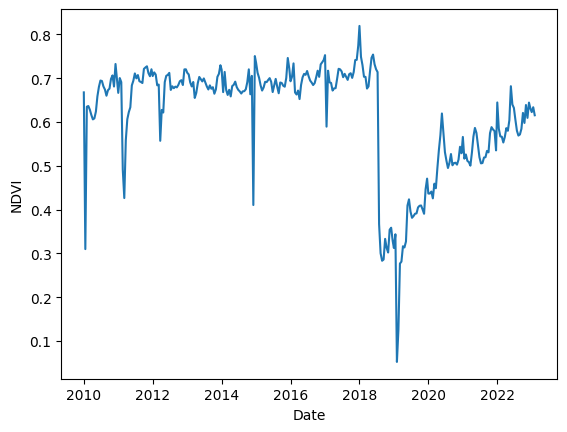

In [29]:
plt.plot(df.date, df['NDVI'])
plt.xlabel("Date")
plt.ylabel("NDVI")

**[Question]**

Can you see a dramatic decrease in NDVI value? When was it? Can you guess the reason for this decrease?

## **Create a histogram of NDVI before and after wildfire**

You will create a histogram to compare the NDVI around the Mendocino county before and after the wildfire event.

In [30]:
# See the image id of all the MODIS NDVI data
ndvi.aggregate_array('system:id').getInfo()

['MODIS/006/MOD13A1/2010_01_01',
 'MODIS/006/MOD13A1/2010_01_17',
 'MODIS/006/MOD13A1/2010_02_02',
 'MODIS/006/MOD13A1/2010_02_18',
 'MODIS/006/MOD13A1/2010_03_06',
 'MODIS/006/MOD13A1/2010_03_22',
 'MODIS/006/MOD13A1/2010_04_07',
 'MODIS/006/MOD13A1/2010_04_23',
 'MODIS/006/MOD13A1/2010_05_09',
 'MODIS/006/MOD13A1/2010_05_25',
 'MODIS/006/MOD13A1/2010_06_10',
 'MODIS/006/MOD13A1/2010_06_26',
 'MODIS/006/MOD13A1/2010_07_12',
 'MODIS/006/MOD13A1/2010_07_28',
 'MODIS/006/MOD13A1/2010_08_13',
 'MODIS/006/MOD13A1/2010_08_29',
 'MODIS/006/MOD13A1/2010_09_14',
 'MODIS/006/MOD13A1/2010_09_30',
 'MODIS/006/MOD13A1/2010_10_16',
 'MODIS/006/MOD13A1/2010_11_01',
 'MODIS/006/MOD13A1/2010_11_17',
 'MODIS/006/MOD13A1/2010_12_03',
 'MODIS/006/MOD13A1/2010_12_19',
 'MODIS/006/MOD13A1/2011_01_01',
 'MODIS/006/MOD13A1/2011_01_17',
 'MODIS/006/MOD13A1/2011_02_02',
 'MODIS/006/MOD13A1/2011_02_18',
 'MODIS/006/MOD13A1/2011_03_06',
 'MODIS/006/MOD13A1/2011_03_22',
 'MODIS/006/MOD13A1/2011_04_07',
 'MODIS/00

In [31]:
# MODIS NDVI imagery before the fire event
ndvi1 = ee.Image('MODIS/006/MOD13A1/2018_06_10').select("NDVI")

# MODIS NDVI imagery after the fire event
ndvi2 = ee.Image('MODIS/006/MOD13A1/2018_09_14').select("NDVI")

In [32]:
# Sample the NDVI image for the region of interest and convert the NDVI image into numpy arrays
ndvi1_arr = np.array(ndvi1.sampleRectangle(region=poi).get('NDVI').getInfo())
ndvi2_arr = np.array(ndvi2.sampleRectangle(region=poi).get('NDVI').getInfo())

Text(0, 0.5, 'Count')

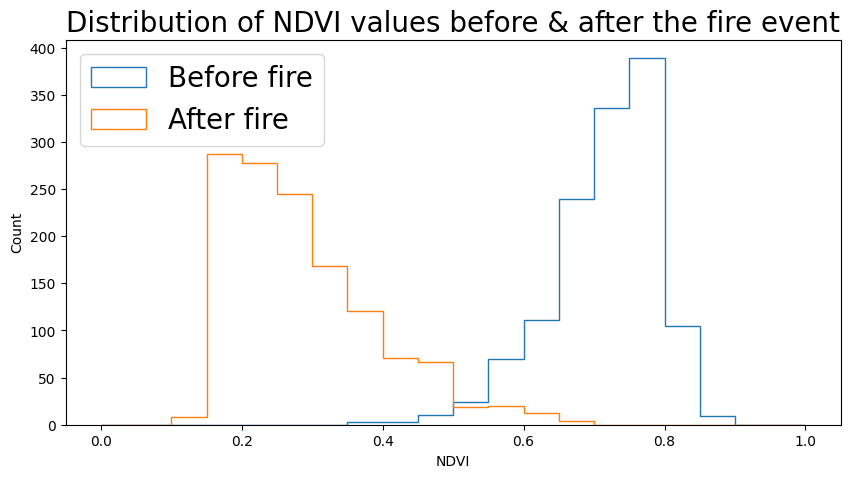

In [33]:
# Multiply 0.0001 to convert digital number into real NDVI value
before_fire = ndvi1_arr.flatten() * 0.0001
after_fire = ndvi2_arr.flatten() * 0.0001

# Draw a histogram to see the NDVI changes before and after the fire event.
fig, ax = plt.subplots(figsize=(10,5))
ax.hist(before_fire, bins = 20, range = (0,1), label = 'Before fire', histtype = 'step')
ax.hist(after_fire, bins = 20, range = (0, 1), label = 'After fire', histtype = 'step')
ax.legend(fontsize=20)
ax.set_title('Distribution of NDVI values before & after the fire event', fontsize=20)
ax.set_xlabel('NDVI')
ax.set_ylabel('Count')

## **Compare Landsat images before and after wildfire**

Let's see what really happened in this region using the Landsat images.

In [34]:
ls1 = ee.ImageCollection('LANDSAT/LC08/C02/T1_TOA') \
    .filterDate('2018-07-01', '2018-07-31') \
    .filterBounds(poi) \
    .filterMetadata('CLOUD_COVER', 'less_than', 10) \
    .sort("CLOUD_COVER")

ls2 = ee.ImageCollection('LANDSAT/LC08/C02/T1_TOA') \
    .filterDate('2019-07-01', '2019-07-31') \
    .filterBounds(poi) \
    .filterMetadata('CLOUD_COVER', 'less_than', 10) \
    .sort("CLOUD_COVER")

In [35]:
# Load a geemap
Map = geemap.Map()

# image visualization factors
vis_param = {'min': 0,
             'max': 0.2,
             'bands': ['B4', 'B3', 'B2'],
             'gamma': 1.0}

Map.addLayer(ls1.first(), vis_param, "Before fire")
Map.addLayer(ls2.first(), vis_param, "After fire")
Map.addLayer(poi, {}, "ROI")

Map.centerObject(poi, 10)

Map

Map(center=[39.19999882336338, -122.80000000000022], controls=(WidgetControl(options=['position', 'transparent…

Now, let's take a look at another huge wildfire, which happened near in Los Angeles this January (Palisades Fire).

In [51]:
poi = ee.Geometry.Point(-118.53, 34.10)

ls1 = ee.ImageCollection('LANDSAT/LC08/C02/T1_TOA') \
    .filterDate('2024-01-01', '2024-03-31') \
    .filterBounds(poi) \
    .filterMetadata('CLOUD_COVER', 'less_than', 10) \
    .sort("CLOUD_COVER")

ls2 = ee.ImageCollection('LANDSAT/LC08/C02/T1_TOA') \
    .filterDate('2025-01-01', '2025-03-31') \
    .filterBounds(poi) \
    .filterMetadata('CLOUD_COVER', 'less_than', 10) \
    .sort("CLOUD_COVER")

In [53]:
# Load a geemap
Map = geemap.Map()

# image visualization factors
vis_param = {'min': 0,
             'max': 0.2,
             'bands': ['B4', 'B3', 'B2'],
             'gamma': 1.0}

Map.addLayer(ls1.first(), vis_param, "Before fire")
Map.addLayer(ls2.first(), vis_param, "After fire")
Map.addLayer(poi, {}, "ROI")

Map.centerObject(poi, 10)

Map

Map(center=[34.099999999999994, -118.53], controls=(WidgetControl(options=['position', 'transparent_bg'], widg…

# **5. Time series of Temperature changes**

Finally, we will see the temporal changes of surface temperatures around Bexar county area using MODIS temperature data.

In [36]:
# Region of interst: Bexar county
Bexar = ee.FeatureCollection('TIGER/2018/Counties').filter(ee.Filter.eq("NAME", "Bexar"))

In [37]:
# MODIS Land surface temperature image collection
temp = ee.ImageCollection("MODIS/061/MOD11A2")

In [38]:
def temp_mean(img):
    mean = img.reduceRegion(reducer=ee.Reducer.mean(), geometry=Bexar.geometry(), scale=1000).get('LST_Day_1km')
    return img.set('date', img.date().format()).set('temp',mean)

In [39]:
bexar_reduced_imgs = temp.map(temp_mean)
bexar_temp_list = bexar_reduced_imgs.reduceColumns(ee.Reducer.toList(2), ['date','temp']).values().get(0)

In [40]:
df_temp = pd.DataFrame(bexar_temp_list.getInfo(), columns=['date', 'temp'])
df_temp['date'] = pd.to_datetime(df_temp['date'])
df_temp['temp'] = df_temp['temp'] * 0.02
df_temp

,date,temp
0,2000-02-26,299.708760
1,2000-03-05,298.464731
2,2000-03-13,298.253659
3,2000-03-21,303.439654
4,2000-03-29,301.618790
...,...,...
1135,2025-02-10,286.598775
1136,2025-02-18,292.893850
1137,2025-02-26,296.651522
1138,2025-03-06,299.610174


Text(0, 0.5, 'Temperature (K)')

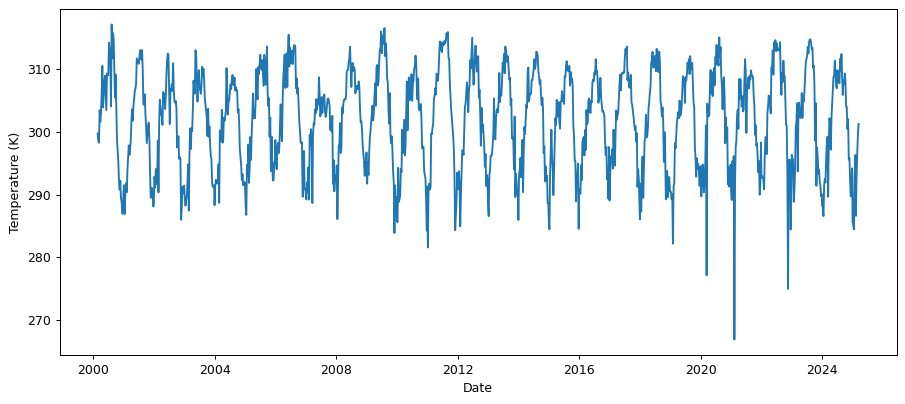

In [41]:
plt.subplots(1, 1, figsize = (12,5), dpi = 90)
plt.plot(df_temp['date'], df_temp['temp'])
plt.xlabel("Date")
plt.ylabel("Temperature (K)")

**[Question]**

Can you see a record low temperature on Fabruary 2021? Does it remind you of any events happening in San Antonio?

[What happened in San Antonio in February 2021? (link to news)](https://www.ksat.com/news/local/2023/02/14/look-back-its-been-2-years-since-texas-devastating-winter-storm-of-february-2021/)

## **References**
- https://geemap.org/tutorials/#geemap-tutorials